<h1>Need to resize Iris correctly</h1>

In [1]:
from __future__ import print_function

import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display # to display images
from PIL import Image
import os, sys
%matplotlib inline 

In [2]:
os.chdir('/Users/xxx/Documents/GANs_Research/my_imps/research_models/v3/')

There are data issues because of the ORIGINAL (nothing to do with my preprocessing) of many of the images that are not properly aligned or scaled. Below is an example of raw, unprocessed images.

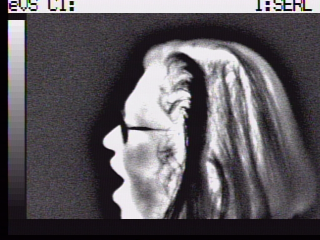

In [4]:
exa= Image.open('/Users/xxx/Documents/Data/Iris_Data_Repo/Iris/Vicky/Expression/ex1/L-1035.bmp')
display(exa)

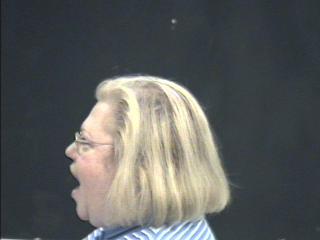

In [5]:
exa_v= Image.open('/Users/xxx/Documents/Data/Iris_Data_Repo/Iris/Vicky/Expression/ex1/V-1035.bmp')
display(exa_v)

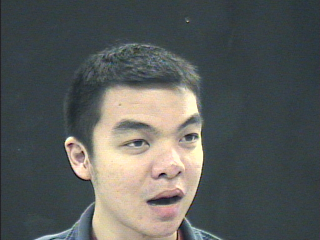

In [38]:
exa2_v = Image.open('/Users/xxx/Documents/Data/Iris_Data_Repo/Iris/bernard/Expression/ex1/V-491.bmp')
display(exa2_v)

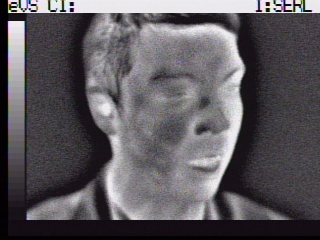

In [39]:
exa2_t = Image.open('/Users/xxx/Documents/Data/Iris_Data_Repo/Iris/bernard/Expression/ex1/L-491.bmp')
display(exa2_t)

I then cropped the thermal and be consistent, also cropped the visible the same dimensions. `cropped = im.crop((25, 20, width-0, height-20)) #cropped`


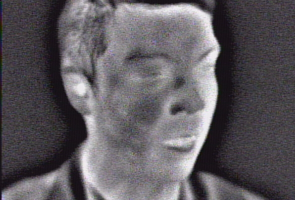

In [40]:
# After cropping out the HUD and resizing

exa2_t_p = Image.open('/Users/xxx/Documents/Data/Iris_Data_Repo/iris_pix_copy/train/thermal/bernard-491.bmp')
display(exa2_t_p)

So in these cases, I cropped the HU - all the borders and text from the thermal image. This leads to an over-exagerrated "zoomed in" type of view of the thermal. Per below:

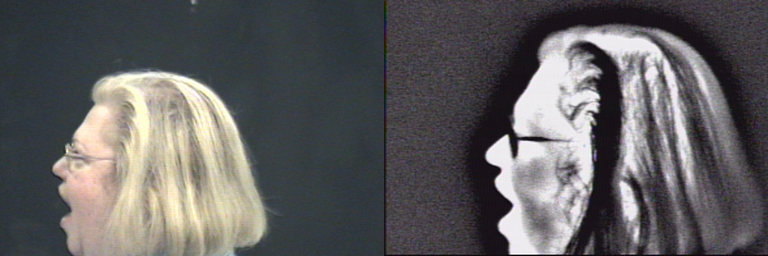

In [6]:
paired_above= Image.open('/Users/xxx/Documents/Data/iris_2splits/test/Vicky-1035.bmp')
display(paired_above)

There is no easy way to fix some of the problems with the original data collection like above. For example, it's not my fault that the thermal image chin is cut. That's from the original image. I can't "add" thermal background, because that would be a misrepresentation. I could always "zoom" into the visible image and largen it. And I can't "add" more to the visible image, either. Like see below: 

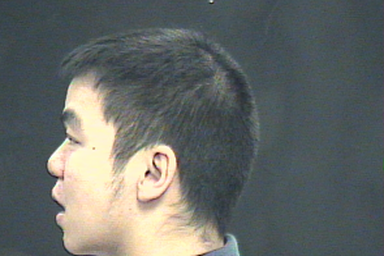

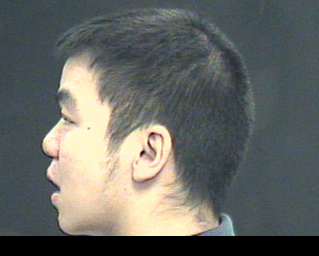

In [51]:
v_im = Image.open('iris_ready_v3/source_dir/bernard-458.bmp')
display(v_im)

cropped_img = v_im.crop((5, 20, v_im.width-60, v_im.height+20)) #left, upper, right, lower
resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
display(cropped_img)
#display(resized)

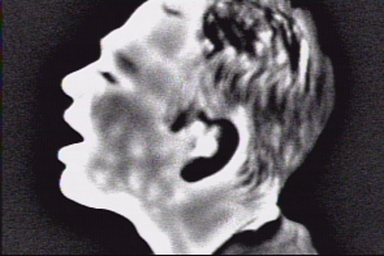

In [13]:
th_im = Image.open('iris_ready_v3/iris_ready_v3/B/train/Balage-721.bmp')
display(th_im)

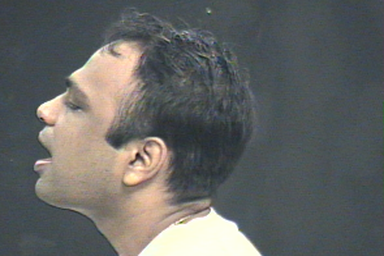

In [14]:
v_im = Image.open('iris_ready_v3/iris_ready_v3/A/train/Balage-721.bmp')
display(v_im)

In [15]:
v_im.height

256

In [16]:
v_im.width

384

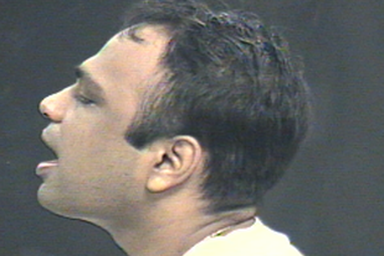

In [26]:
cropped_img = v_im.crop((5, 20, v_im.width-70, v_im.height-15)) #left, upper, right, lower
resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
#display(cropped_img)
display(resized)

`Source_Dir` will be a parking lot of all the images for each subject.

In [36]:
# Train Visible Images

test_path = "iris_ready_v3/source_dir" # source
outpath =  "iris_ready_v3/target_dir/A/train" # target
#dirs = os.listdir(path)
neww, newh = 384, 256

def process_iris(mypath, outpath):
    dirs = os.listdir(mypath)
    counter = 1
    for item in dirs:
        fullpath = os.path.join(mypath, item)
        if os.path.isfile(fullpath):
            counter += 1
            im = Image.open(fullpath)
            f, e = os.path.splitext(fullpath) #file and extension
            cropped_img = im.crop((5, 20, v_im.width-70, v_im.height-15)) #left, upper, right, lower
            resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
            #resized = im.resize((neww, newh), Image.ANTIALIAS) #resize
            save_fname = os.path.join(outpath, os.path.basename(f) +'.bmp')
            resized.save(save_fname, quality=100)
            if counter <=10:
                display(resized) #see in notebook


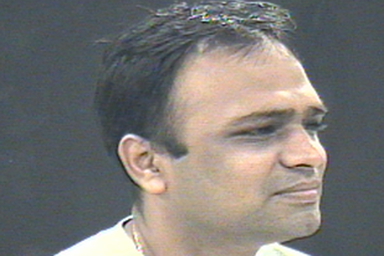

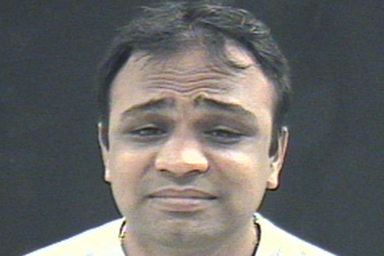

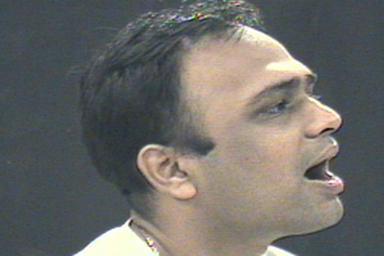

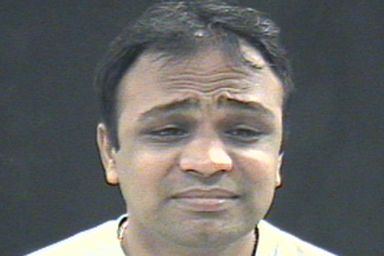

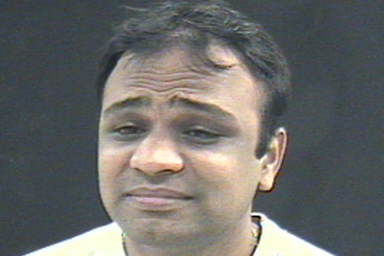

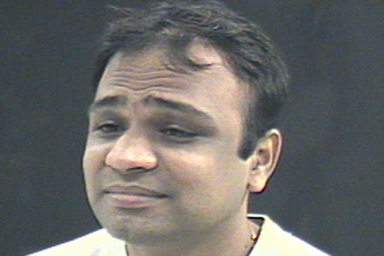

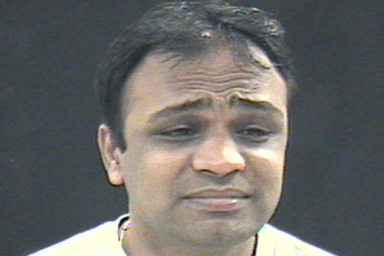

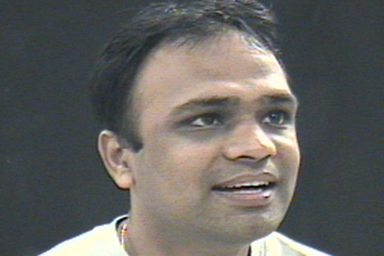

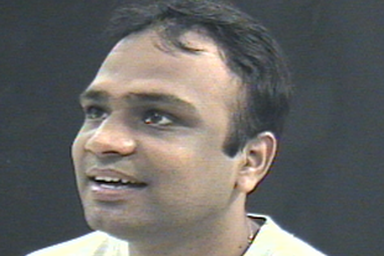

In [37]:
process_iris(test_path, outpath)

<b>Bernard</b>

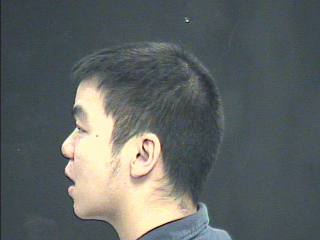

In [16]:
v_im = Image.open('source_dir/bernard-458.bmp') # this is the very original image
display(v_im)

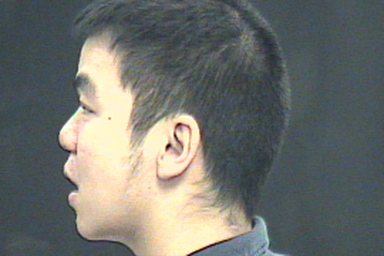

In [29]:
cropped_img = v_im.crop((20, 55, v_im.width-30, v_im.height-10)) #left, upper, right, lower
resized = cropped_img.resize((384, 256), Image.ANTIALIAS) #resize
#display(cropped_img)
display(resized)

In [30]:
#test_path = "iris_ready_v3/source_dir" # source
#outpath =  "iris_ready_v3/target_dir/A/train" # target
#dirs = os.listdir(path)
neww, newh = 384, 256

def process_iris(mypath, outpath):
    dirs = os.listdir(mypath)
    counter = 1
    for item in dirs:
        fullpath = os.path.join(mypath, item)
        if os.path.isfile(fullpath):
            counter += 1
            im = Image.open(fullpath)
            f, e = os.path.splitext(fullpath) #file and extension
            cropped_img = im.crop((20, 55, v_im.width-30, v_im.height-10)) #left, upper, right, lower
            resized = cropped_img.resize((neww, newh), Image.ANTIALIAS) #resize
            #resized = im.resize((neww, newh), Image.ANTIALIAS) #resize
            save_fname = os.path.join(outpath, os.path.basename(f) +'.bmp')
            resized.save(save_fname, quality=100)
            if counter <=10:
                display(resized) #see in notebook


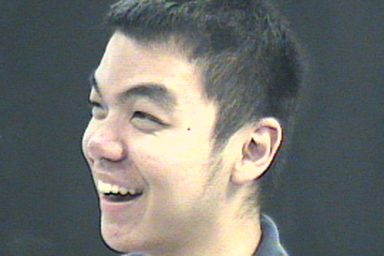

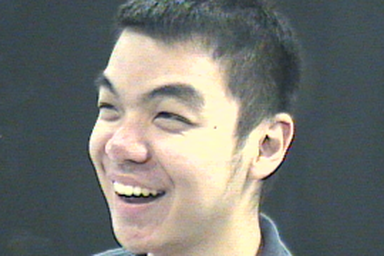

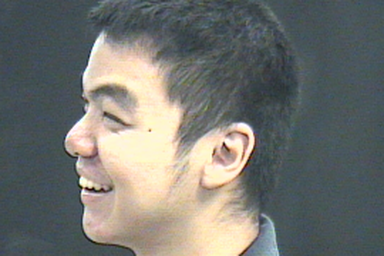

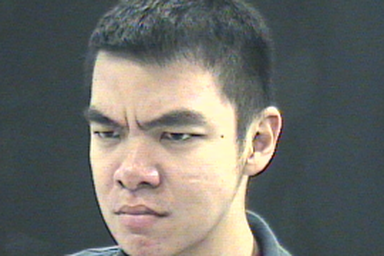

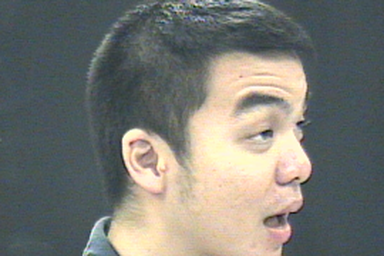

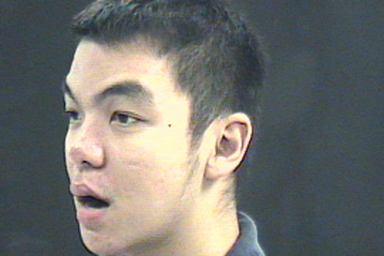

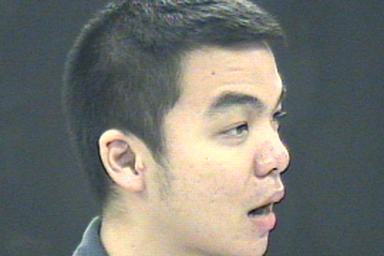

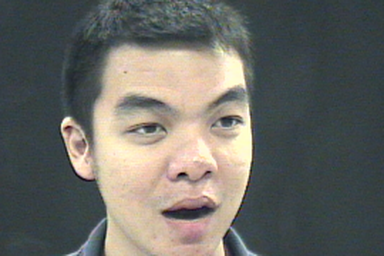

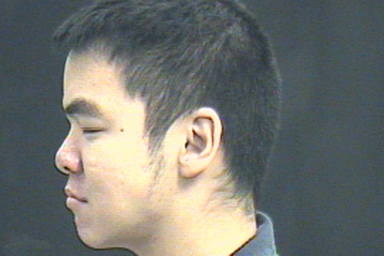

In [31]:
# ignore this part - had to redo on 10/16 b/c I forgot to add Bernard to the training set

test_path = '/Users/xxx/Documents/GANs_Research/my_imps/research_models/v3/bernard_source'
outpath = '/Users/xxx/Documents/GANs_Research/my_imps/research_models/v3/bernard_target'
process_iris(test_path, outpath)



# ....

<b>Brad zoom in</b>

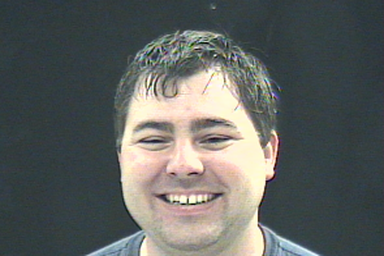

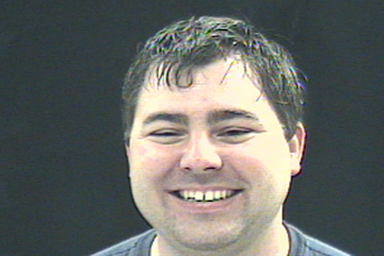

In [177]:
v_im = Image.open('iris_ready_v3/source_dir/brad-202.bmp')
display(v_im)
cropped_img = v_im.crop((5, 15, v_im.width-35, v_im.height)) #left, upper, right, lower
resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
#display(cropped_img)
display(resized)

In [178]:
def process_iris(mypath, outpath):
    dirs = os.listdir(mypath)
    counter = 1
    for item in dirs:
        fullpath = os.path.join(mypath, item)
        if os.path.isfile(fullpath):
            counter += 1
            im = Image.open(fullpath)
            f, e = os.path.splitext(fullpath) #file and extension
            cropped_img = im.crop((5, 15, v_im.width-35, v_im.height)) #left, upper, right, lower
            resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
            #resized = im.resize((neww, newh), Image.ANTIALIAS) #resize
            save_fname = os.path.join(outpath, os.path.basename(f) +'.bmp')
            resized.save(save_fname, quality=100)
            #if counter <=10:
                #display(resized) #see in notebook
    print("done")

    
process_iris(test_path, outpath)

done


<b>Charles</b> We can zoom in on his visible more

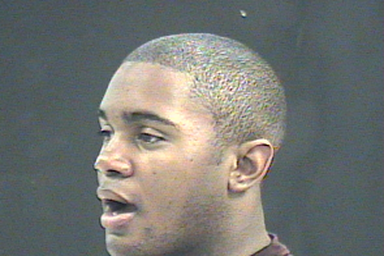

In [80]:
v_im = Image.open('iris_ready_v3/source_dir/Charles-61.bmp')
display(v_im)

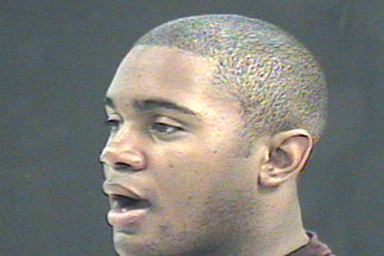

In [83]:
cropped_img = v_im.crop((10, 20, v_im.width-50, v_im.height)) #left, upper, right, lower
resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
#display(cropped_img)
display(resized)

In [84]:
test_path = "iris_ready_v3/source_dir" # source
outpath =  "iris_ready_v3/target_dir/A/train" # target
#dirs = os.listdir(path)
neww, newh = 384, 256

def process_iris(mypath, outpath):
    dirs = os.listdir(mypath)
    counter = 1
    for item in dirs:
        fullpath = os.path.join(mypath, item)
        if os.path.isfile(fullpath):
            counter += 1
            im = Image.open(fullpath)
            f, e = os.path.splitext(fullpath) #file and extension
            cropped_img = im.crop((10, 20, v_im.width-30, v_im.height)) #left, upper, right, lower
            resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
            #resized = im.resize((neww, newh), Image.ANTIALIAS) #resize
            save_fname = os.path.join(outpath, os.path.basename(f) +'.bmp')
            resized.save(save_fname, quality=100)
            if counter <=10:
                display(resized) #see in notebook


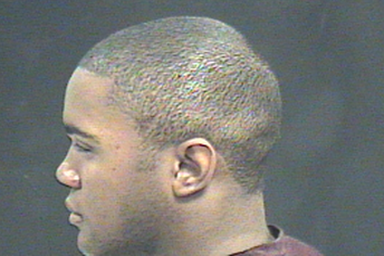

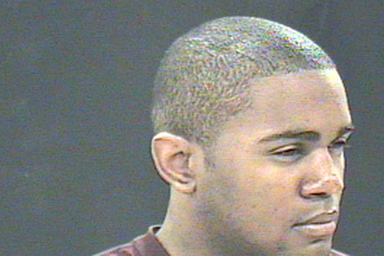

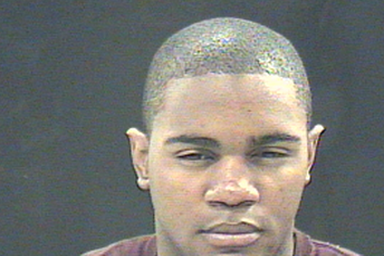

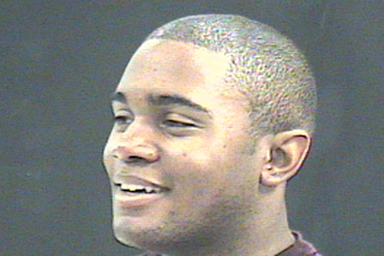

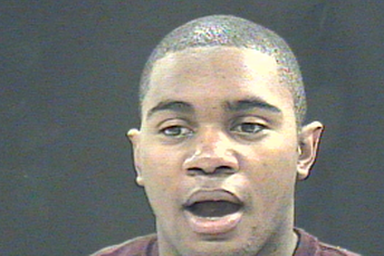

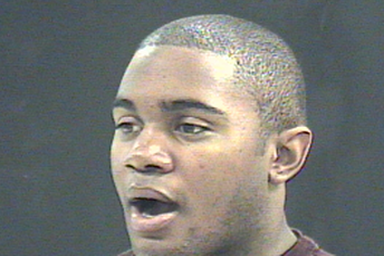

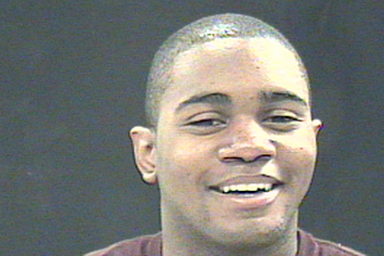

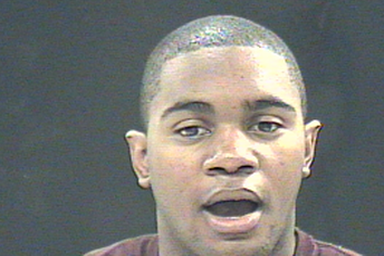

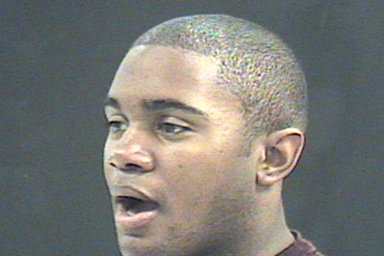

In [85]:
process_iris(test_path, outpath)

<b>Chris</b> zoom in

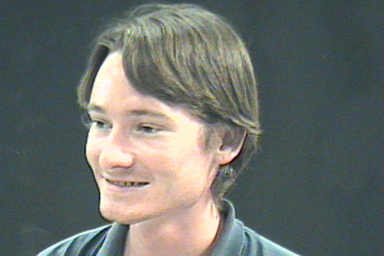

In [96]:
v_im = Image.open('iris_ready_v3/source_dir/Chris-1225.bmp')
display(v_im)

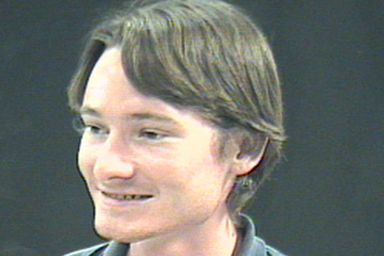

In [104]:
cropped_img = v_im.crop((20, 10, v_im.width-40, v_im.height-20)) #left, upper, right, lower
resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
#display(cropped_img)
display(resized)

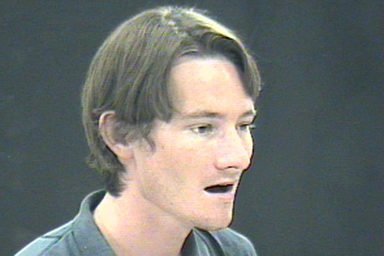

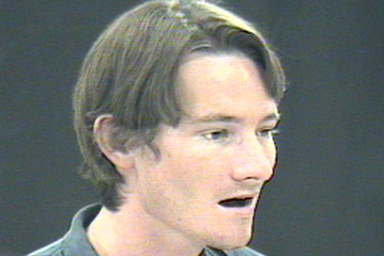

In [105]:
v_im = Image.open('iris_ready_v3/source_dir/Chris-1172.bmp')
display(v_im)
cropped_img = v_im.crop((20, 10, v_im.width-40, v_im.height-20)) #left, upper, right, lower
resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
#display(cropped_img)
display(resized)

In [107]:
test_path = "iris_ready_v3/source_dir" # source
outpath =  "iris_ready_v3/target_dir/A/train" # target
#dirs = os.listdir(path)
neww, newh = 384, 256

def process_iris(mypath, outpath):
    dirs = os.listdir(mypath)
    counter = 1
    for item in dirs:
        fullpath = os.path.join(mypath, item)
        if os.path.isfile(fullpath):
            counter += 1
            im = Image.open(fullpath)
            f, e = os.path.splitext(fullpath) #file and extension
            cropped_img = im.crop((20, 10, v_im.width-40, v_im.height-20)) #left, upper, right, lower
            resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
            #resized = im.resize((neww, newh), Image.ANTIALIAS) #resize
            save_fname = os.path.join(outpath, os.path.basename(f) +'.bmp')
            resized.save(save_fname, quality=100)
            #if counter <=10:
                #display(resized) #see in notebook
    print("done")

    
process_iris(test_path, outpath)

done


<b>David, zoom in</b>

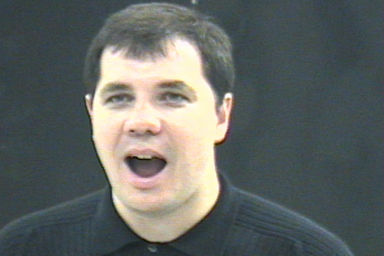

In [144]:
v_im = Image.open('iris_ready_v3/source_dir/David-1047.bmp')
display(v_im)

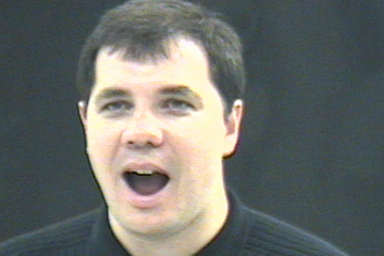

In [150]:
cropped_img = v_im.crop((15, 5, v_im.width-25, v_im.height-25)) #left, upper, right, lower
resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
#display(cropped_img)
display(resized)

In [151]:
test_path = "iris_ready_v3/source_dir" # source
outpath =  "iris_ready_v3/target_dir/A/train" # target
#dirs = os.listdir(path)
neww, newh = 384, 256

def process_iris(mypath, outpath):
    dirs = os.listdir(mypath)
    counter = 1
    for item in dirs:
        fullpath = os.path.join(mypath, item)
        if os.path.isfile(fullpath):
            counter += 1
            im = Image.open(fullpath)
            f, e = os.path.splitext(fullpath) #file and extension
            cropped_img = im.crop((15, 5, v_im.width-25, v_im.height-25)) #left, upper, right, lower
            resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
            #resized = im.resize((neww, newh), Image.ANTIALIAS) #resize
            save_fname = os.path.join(outpath, os.path.basename(f) +'.bmp')
            resized.save(save_fname, quality=100)
            #if counter <=10:
                #display(resized) #see in notebook
    print("done")

    
process_iris(test_path, outpath)

done


<b>Faysal - zoom in</b>

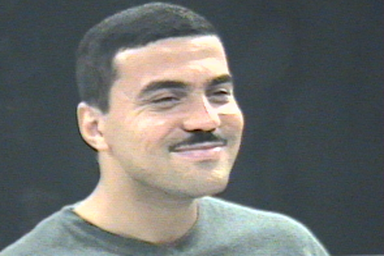

In [152]:
v_im = Image.open('iris_ready_v3/source_dir/Faysal-176.bmp')
display(v_im)

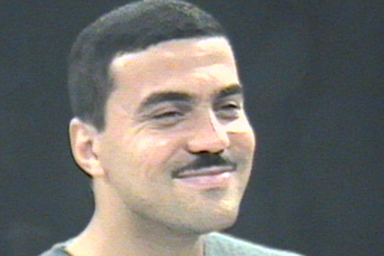

In [155]:
cropped_img = v_im.crop((15, 5, v_im.width-25, v_im.height-40)) #left, upper, right, lower
resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
#display(cropped_img)
display(resized)

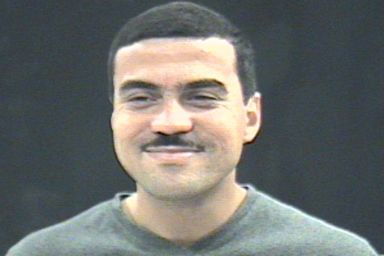

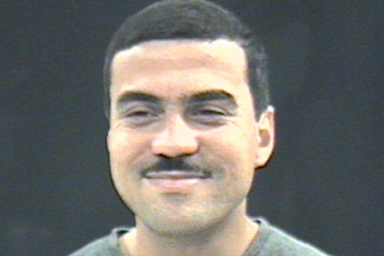

In [157]:
v_im = Image.open('iris_ready_v3/source_dir/Faysal-184.bmp')
display(v_im)
cropped_img = v_im.crop((15, 5, v_im.width-25, v_im.height-40)) #left, upper, right, lower
resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
#display(cropped_img)
display(resized)

In [158]:
test_path = "iris_ready_v3/source_dir" # source
outpath =  "iris_ready_v3/target_dir/A/train" # target
#dirs = os.listdir(path)
neww, newh = 384, 256

def process_iris(mypath, outpath):
    dirs = os.listdir(mypath)
    counter = 1
    for item in dirs:
        fullpath = os.path.join(mypath, item)
        if os.path.isfile(fullpath):
            counter += 1
            im = Image.open(fullpath)
            f, e = os.path.splitext(fullpath) #file and extension
            cropped_img = im.crop((15, 5, v_im.width-25, v_im.height-40)) #left, upper, right, lower
            resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
            #resized = im.resize((neww, newh), Image.ANTIALIAS) #resize
            save_fname = os.path.join(outpath, os.path.basename(f) +'.bmp')
            resized.save(save_fname, quality=100)
            #if counter <=10:
                #display(resized) #see in notebook
    print("done")

    
process_iris(test_path, outpath)

done


<b>Gribok</b>

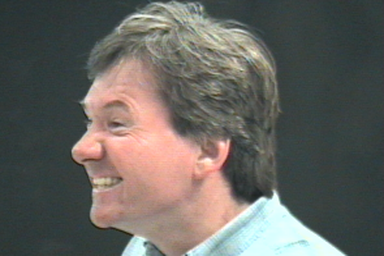

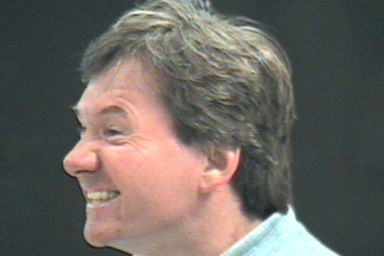

In [160]:
v_im = Image.open('iris_ready_v3/source_dir/Gribok-1209.bmp')
display(v_im)
cropped_img = v_im.crop((15, 5, v_im.width-25, v_im.height-20)) #left, upper, right, lower
resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
#display(cropped_img)
display(resized)

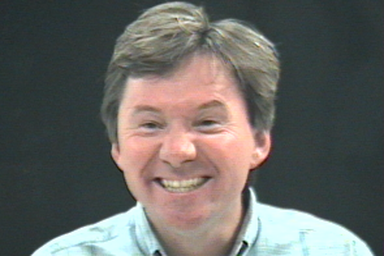

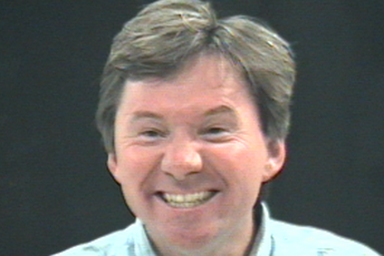

In [161]:
v_im = Image.open('iris_ready_v3/source_dir/Gribok-1221.bmp')
display(v_im)
cropped_img = v_im.crop((15, 5, v_im.width-25, v_im.height-20)) #left, upper, right, lower
resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
#display(cropped_img)
display(resized)

In [163]:
test_path = "iris_ready_v3/source_dir" # source
outpath =  "iris_ready_v3/target_dir/A/train" # target
#dirs = os.listdir(path)
neww, newh = 384, 256

def process_iris(mypath, outpath):
    dirs = os.listdir(mypath)
    counter = 1
    for item in dirs:
        fullpath = os.path.join(mypath, item)
        if os.path.isfile(fullpath):
            counter += 1
            im = Image.open(fullpath)
            f, e = os.path.splitext(fullpath) #file and extension
            cropped_img = im.crop((15, 5, v_im.width-25, v_im.height-20)) #left, upper, right, lower
            resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
            #resized = im.resize((neww, newh), Image.ANTIALIAS) #resize
            save_fname = os.path.join(outpath, os.path.basename(f) +'.bmp')
            resized.save(save_fname, quality=100)
            #if counter <=10:
                #display(resized) #see in notebook
    print("done")

    
process_iris(test_path, outpath)

done


<b>Hari zoom in</b>

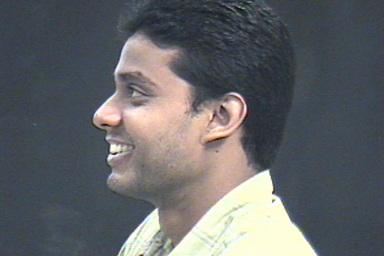

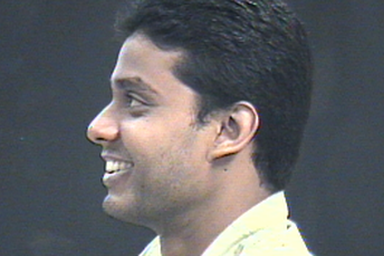

In [165]:
v_im = Image.open('iris_ready_v3/source_dir/hari-1156.bmp')
display(v_im)
cropped_img = v_im.crop((15, 5, v_im.width-25, v_im.height-30)) #left, upper, right, lower
resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
#display(cropped_img)
display(resized)

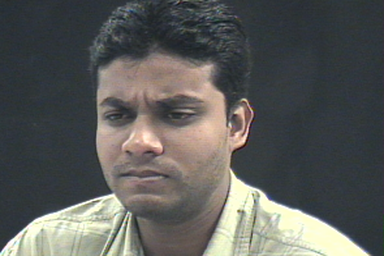

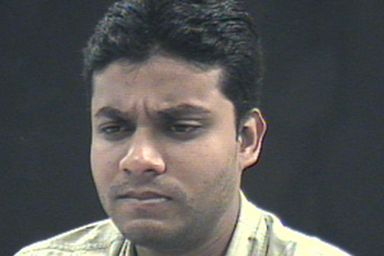

In [166]:
v_im = Image.open('iris_ready_v3/source_dir/hari-1246.bmp')
display(v_im)
cropped_img = v_im.crop((15, 5, v_im.width-25, v_im.height-30)) #left, upper, right, lower
resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
#display(cropped_img)
display(resized)

In [167]:
def process_iris(mypath, outpath):
    dirs = os.listdir(mypath)
    counter = 1
    for item in dirs:
        fullpath = os.path.join(mypath, item)
        if os.path.isfile(fullpath):
            counter += 1
            im = Image.open(fullpath)
            f, e = os.path.splitext(fullpath) #file and extension
            cropped_img = im.crop((15, 5, v_im.width-25, v_im.height-30)) #left, upper, right, lower
            resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
            #resized = im.resize((neww, newh), Image.ANTIALIAS) #resize
            save_fname = os.path.join(outpath, os.path.basename(f) +'.bmp')
            resized.save(save_fname, quality=100)
            #if counter <=10:
                #display(resized) #see in notebook
    print("done")

    
process_iris(test_path, outpath)

done


<b>Heo</b> is ok - no need to redo

<b>Justin - zoom </b>

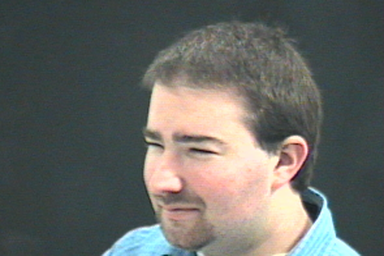

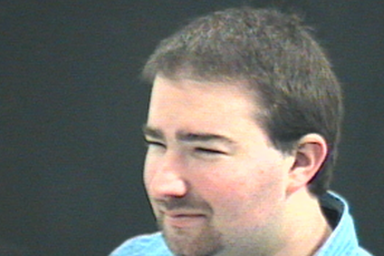

In [186]:
v_im = Image.open('iris_ready_v3/source_dir/justin-1230.bmp')
display(v_im)
cropped_img = v_im.crop((15, 15, v_im.width-25, v_im.height-10)) #left, upper, right, lower
resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
#display(cropped_img)
display(resized)

In [187]:
def process_iris(mypath, outpath):
    dirs = os.listdir(mypath)
    counter = 1
    for item in dirs:
        fullpath = os.path.join(mypath, item)
        if os.path.isfile(fullpath):
            counter += 1
            im = Image.open(fullpath)
            f, e = os.path.splitext(fullpath) #file and extension
            cropped_img = im.crop((15, 15, v_im.width-25, v_im.height-10)) #left, upper, right, lower
            resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
            #resized = im.resize((neww, newh), Image.ANTIALIAS) #resize
            save_fname = os.path.join(outpath, os.path.basename(f) +'.bmp')
            resized.save(save_fname, quality=100)
            #if counter <=10:
                #display(resized) #see in notebook
    print("done")

    
process_iris(test_path, outpath)

done


<b>Kong</b>

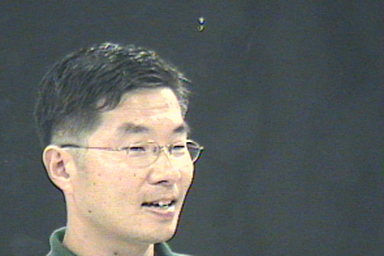

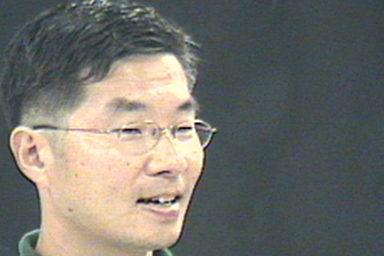

In [206]:
v_im = Image.open('iris_ready_v3/source_dir/kong-1267.bmp')
display(v_im)
cropped_img = v_im.crop((35, 45, v_im.width-50, v_im.height-8)) #left, upper, right, lower
resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
#display(cropped_img)
display(resized)

In [207]:
def process_iris(mypath, outpath):
    dirs = os.listdir(mypath)
    counter = 1
    for item in dirs:
        fullpath = os.path.join(mypath, item)
        if os.path.isfile(fullpath):
            counter += 1
            im = Image.open(fullpath)
            f, e = os.path.splitext(fullpath) #file and extension
            cropped_img = im.crop((35, 45, v_im.width-50, v_im.height-8)) #left, upper, right, lower
            resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
            #resized = im.resize((neww, newh), Image.ANTIALIAS) #resize
            save_fname = os.path.join(outpath, os.path.basename(f) +'.bmp')
            resized.save(save_fname, quality=100)
            #if counter <=10:
                #display(resized) #see in notebook
    print("done")

    
process_iris(test_path, outpath)

done


<b>Koschan</b>

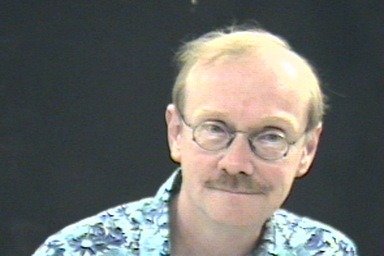

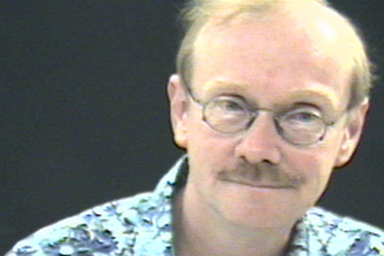

In [210]:
v_im = Image.open('iris_ready_v3/source_dir/Koschan-1749.bmp')
display(v_im)
cropped_img = v_im.crop((35, 45, v_im.width-50, v_im.height-8)) #left, upper, right, lower
resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
#display(cropped_img)
display(resized)

In [211]:
def process_iris(mypath, outpath):
    dirs = os.listdir(mypath)
    counter = 1
    for item in dirs:
        fullpath = os.path.join(mypath, item)
        if os.path.isfile(fullpath):
            counter += 1
            im = Image.open(fullpath)
            f, e = os.path.splitext(fullpath) #file and extension
            cropped_img = im.crop((35, 45, v_im.width-50, v_im.height-8)) #left, upper, right, lower
            resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
            #resized = im.resize((neww, newh), Image.ANTIALIAS) #resize
            save_fname = os.path.join(outpath, os.path.basename(f) +'.bmp')
            resized.save(save_fname, quality=100)
            #if counter <=10:
                #display(resized) #see in notebook
    print("done")

    
process_iris(test_path, outpath)

done


<b>Mark - needs a little zoom</b>

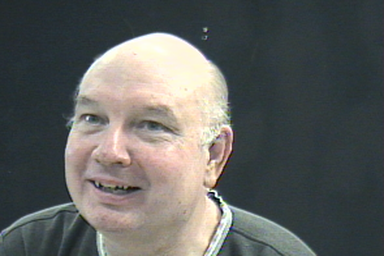

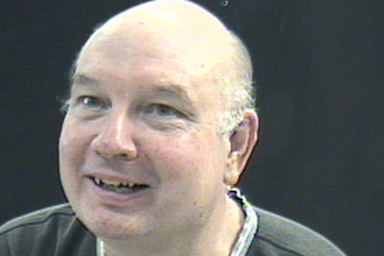

In [228]:
v_im = Image.open('iris_ready_v3/source_dir/Mark-1287.bmp')
display(v_im)
cropped_img = v_im.crop((15, 35, v_im.width-45, v_im.height-10)) #left, upper, right, lower
resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
#display(cropped_img)
display(resized)

In [229]:
def process_iris(mypath, outpath):
    dirs = os.listdir(mypath)
    counter = 1
    for item in dirs:
        fullpath = os.path.join(mypath, item)
        if os.path.isfile(fullpath):
            counter += 1
            im = Image.open(fullpath)
            f, e = os.path.splitext(fullpath) #file and extension
            cropped_img = im.crop((15, 35, v_im.width-45, v_im.height-10)) #left, upper, right, lower
            resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
            #resized = im.resize((neww, newh), Image.ANTIALIAS) #resize
            save_fname = os.path.join(outpath, os.path.basename(f) +'.bmp')
            resized.save(save_fname, quality=100)
            #if counter <=10:
                #display(resized) #see in notebook
    print("done")

    
process_iris(test_path, outpath)

done


<b>Mattew</b>

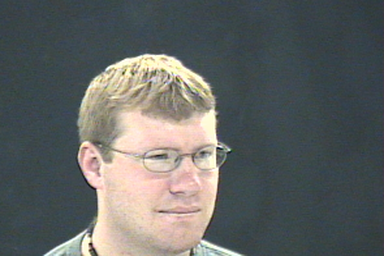

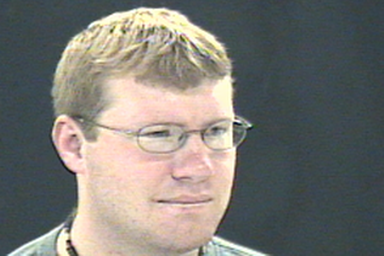

In [246]:
v_im = Image.open('iris_ready_v3/source_dir/Mattew-1544.bmp')
display(v_im)
cropped_img = v_im.crop((38, 48, v_im.width-52, v_im.height)) #left, upper, right, lower
resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
#display(cropped_img)
display(resized)

In [247]:
def process_iris(mypath, outpath):
    dirs = os.listdir(mypath)
    counter = 1
    for item in dirs:
        fullpath = os.path.join(mypath, item)
        if os.path.isfile(fullpath):
            counter += 1
            im = Image.open(fullpath)
            f, e = os.path.splitext(fullpath) #file and extension
            cropped_img = im.crop((38, 48, v_im.width-52, v_im.height)) #left, upper, right, lower
            resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
            #resized = im.resize((neww, newh), Image.ANTIALIAS) #resize
            save_fname = os.path.join(outpath, os.path.basename(f) +'.bmp')
            resized.save(save_fname, quality=100)
            #if counter <=10:
                #display(resized) #see in notebook
    print("done")

    
process_iris(test_path, outpath)

done


<b>Michael</b>

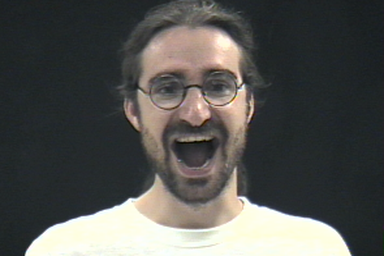

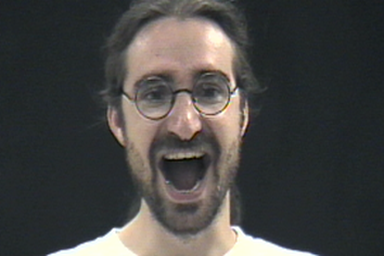

In [270]:
v_im = Image.open('iris_ready_v3/source_dir/Michael-151.bmp')
display(v_im)
cropped_img = v_im.crop((25, 12, v_im.width-5, v_im.height-35)) #left, upper, right, lower
resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
#display(cropped_img)
display(resized)

In [272]:
def process_iris(mypath, outpath):
    dirs = os.listdir(mypath)
    counter = 1
    for item in dirs:
        fullpath = os.path.join(mypath, item)
        if os.path.isfile(fullpath):
            counter += 1
            im = Image.open(fullpath)
            f, e = os.path.splitext(fullpath) #file and extension
            cropped_img = im.crop((25, 12, v_im.width-5, v_im.height-35)) #left, upper, right, lower
            resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
            #resized = im.resize((neww, newh), Image.ANTIALIAS) #resize
            save_fname = os.path.join(outpath, os.path.basename(f) +'.bmp')
            resized.save(save_fname, quality=100)
            #if counter <=10:
                #display(resized) #see in notebook
    print("done")

    
process_iris(test_path, outpath)

done


<b>Nash is ok</b>

<b>Priya</b>

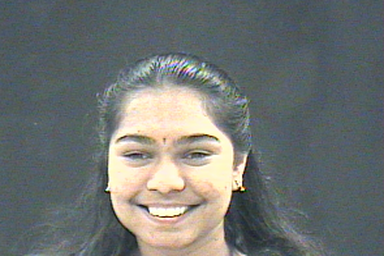

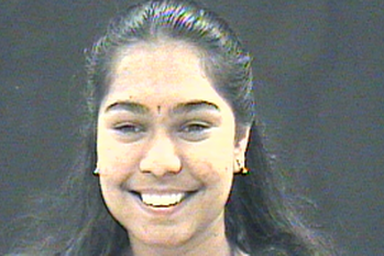

In [299]:
v_im = Image.open('iris_ready_v3/source_dir/priya-1132.bmp')
display(v_im)
cropped_img = v_im.crop((20, 55, v_im.width-15, v_im.height)) #left, upper, right, lower
resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
#display(cropped_img)
display(resized)

In [300]:
def process_iris(mypath, outpath):
    dirs = os.listdir(mypath)
    counter = 1
    for item in dirs:
        fullpath = os.path.join(mypath, item)
        if os.path.isfile(fullpath):
            counter += 1
            im = Image.open(fullpath)
            f, e = os.path.splitext(fullpath) #file and extension
            cropped_img = im.crop((20, 55, v_im.width-15, v_im.height)) #left, upper, right, lower
            resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
            #resized = im.resize((neww, newh), Image.ANTIALIAS) #resize
            save_fname = os.path.join(outpath, os.path.basename(f) +'.bmp')
            resized.save(save_fname, quality=100)
            #if counter <=10:
                #display(resized) #see in notebook
    print("done")

    
process_iris(test_path, outpath)

done


<b>Rangan is ok</b>

<b>Sangku can be zoomed in a little</b>

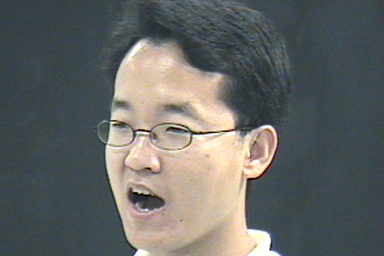

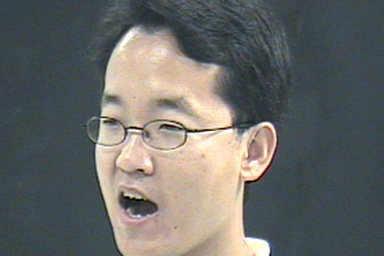

In [311]:
v_im = Image.open('iris_ready_v3/source_dir/Sangkyu-212.bmp')
display(v_im)
cropped_img = v_im.crop((15, 15, v_im.width-5, v_im.height-10)) #left, upper, right, lower
resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
#display(cropped_img)
display(resized)

In [312]:
def process_iris(mypath, outpath):
    dirs = os.listdir(mypath)
    counter = 1
    for item in dirs:
        fullpath = os.path.join(mypath, item)
        if os.path.isfile(fullpath):
            counter += 1
            im = Image.open(fullpath)
            f, e = os.path.splitext(fullpath) #file and extension
            cropped_img = im.crop((15, 15, v_im.width-5, v_im.height-10)) #left, upper, right, lower
            resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
            #resized = im.resize((neww, newh), Image.ANTIALIAS) #resize
            save_fname = os.path.join(outpath, os.path.basename(f) +'.bmp')
            resized.save(save_fname, quality=100)
            #if counter <=10:
                #display(resized) #see in notebook
    print("done")

    
process_iris(test_path, outpath)

done


<b>Sarath could be zoomed in a little more</b>

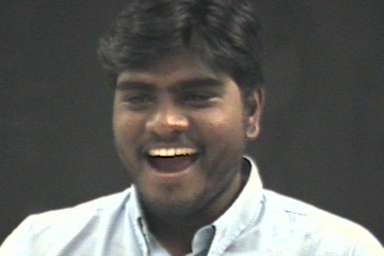

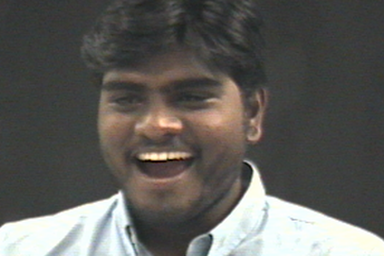

In [320]:
v_im = Image.open('iris_ready_v3/source_dir/Sarath-115.bmp')
display(v_im)
cropped_img = v_im.crop((25, 5, v_im.width-15, v_im.height-10)) #left, upper, right, lower
resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
#display(cropped_img)
display(resized)

In [321]:
def process_iris(mypath, outpath):
    dirs = os.listdir(mypath)
    counter = 1
    for item in dirs:
        fullpath = os.path.join(mypath, item)
        if os.path.isfile(fullpath):
            counter += 1
            im = Image.open(fullpath)
            f, e = os.path.splitext(fullpath) #file and extension
            cropped_img = im.crop((25, 5, v_im.width-15, v_im.height-10)) #left, upper, right, lower
            resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
            #resized = im.resize((neww, newh), Image.ANTIALIAS) #resize
            save_fname = os.path.join(outpath, os.path.basename(f) +'.bmp')
            resized.save(save_fname, quality=100)
            #if counter <=10:
                #display(resized) #see in notebook
    print("done")

    
process_iris(test_path, outpath)

done


<b>Shafik</b>

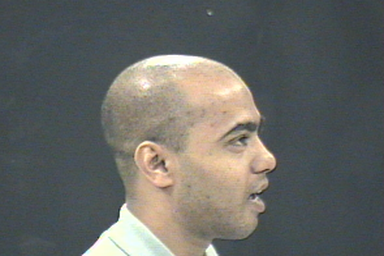

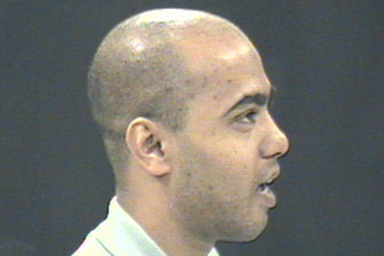

In [332]:
v_im = Image.open('iris_ready_v3/source_dir/Shafik-248.bmp')
display(v_im)
cropped_img = v_im.crop((25, 48, v_im.width-25, v_im.height-5)) #left, upper, right, lower
resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
#display(cropped_img)
display(resized)

In [333]:
def process_iris(mypath, outpath):
    dirs = os.listdir(mypath)
    counter = 1
    for item in dirs:
        fullpath = os.path.join(mypath, item)
        if os.path.isfile(fullpath):
            counter += 1
            im = Image.open(fullpath)
            f, e = os.path.splitext(fullpath) #file and extension
            cropped_img = im.crop((25, 48, v_im.width-25, v_im.height-5)) #left, upper, right, lower
            resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
            #resized = im.resize((neww, newh), Image.ANTIALIAS) #resize
            save_fname = os.path.join(outpath, os.path.basename(f) +'.bmp')
            resized.save(save_fname, quality=100)
            #if counter <=10:
                #display(resized) #see in notebook
    print("done")

    
process_iris(test_path, outpath)

done


<b>Sharon</b>

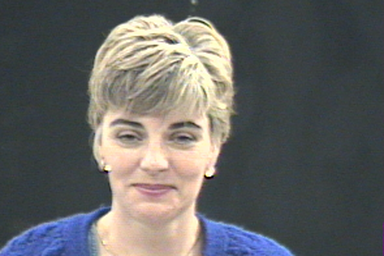

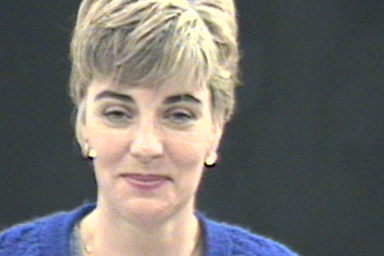

In [342]:
v_im = Image.open('iris_ready_v3/source_dir/Sharon-1411.bmp')
display(v_im)
cropped_img = v_im.crop((28, 48, v_im.width-25, v_im.height-8)) #left, upper, right, lower
resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
#display(cropped_img)
display(resized)

In [343]:
def process_iris(mypath, outpath):
    dirs = os.listdir(mypath)
    counter = 1
    for item in dirs:
        fullpath = os.path.join(mypath, item)
        if os.path.isfile(fullpath):
            counter += 1
            im = Image.open(fullpath)
            f, e = os.path.splitext(fullpath) #file and extension
            cropped_img = im.crop((28, 48, v_im.width-25, v_im.height-8)) #left, upper, right, lower
            resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
            #resized = im.resize((neww, newh), Image.ANTIALIAS) #resize
            save_fname = os.path.join(outpath, os.path.basename(f) +'.bmp')
            resized.save(save_fname, quality=100)
            #if counter <=10:
                #display(resized) #see in notebook
    print("done")

    
process_iris(test_path, outpath)

done


<b>Tak</b>

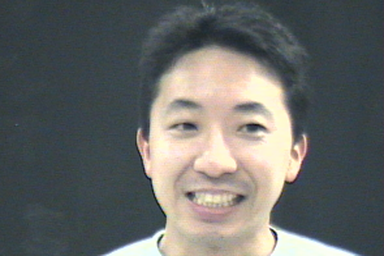

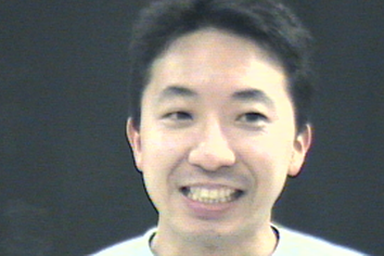

In [354]:
v_im = Image.open('iris_ready_v3/source_dir/Tak-115.bmp')
display(v_im)
cropped_img = v_im.crop((20, 20, v_im.width-10, v_im.height)) #left, upper, right, lower
resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
#display(cropped_img)
display(resized)

In [356]:
def process_iris(mypath, outpath):
    dirs = os.listdir(mypath)
    counter = 1
    for item in dirs:
        fullpath = os.path.join(mypath, item)
        if os.path.isfile(fullpath):
            counter += 1
            im = Image.open(fullpath)
            f, e = os.path.splitext(fullpath) #file and extension
            cropped_img = im.crop((20, 20, v_im.width-10, v_im.height)) #left, upper, right, lower
            resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
            #resized = im.resize((neww, newh), Image.ANTIALIAS) #resize
            save_fname = os.path.join(outpath, os.path.basename(f) +'.bmp')
            resized.save(save_fname, quality=100)
            #if counter <=10:
                #display(resized) #see in notebook
    print("done")

    
process_iris(test_path, outpath)

done


<b>Uma</b>

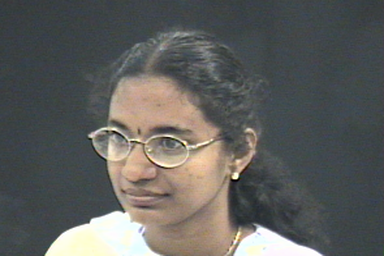

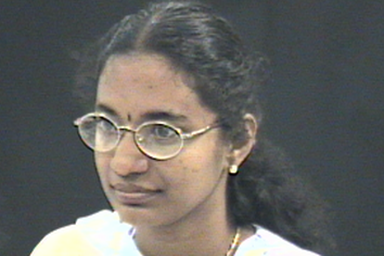

In [364]:
v_im = Image.open('iris_ready_v3/source_dir/Uma-1202.bmp')
display(v_im)
cropped_img = v_im.crop((20, 30, v_im.width-10, v_im.height-5)) #left, upper, right, lower
resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
#display(cropped_img)
display(resized)

In [366]:
def process_iris(mypath, outpath):
    dirs = os.listdir(mypath)
    counter = 1
    for item in dirs:
        fullpath = os.path.join(mypath, item)
        if os.path.isfile(fullpath):
            counter += 1
            im = Image.open(fullpath)
            f, e = os.path.splitext(fullpath) #file and extension
            cropped_img = im.crop((20, 30, v_im.width-10, v_im.height-5)) #left, upper, right, lower
            resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
            #resized = im.resize((neww, newh), Image.ANTIALIAS) #resize
            save_fname = os.path.join(outpath, os.path.basename(f) +'.bmp')
            resized.save(save_fname, quality=100)
            #if counter <=10:
                #display(resized) #see in notebook
    print("done")

    
process_iris(test_path, outpath)

done


<b>Last subject in training set: Vivek</b>

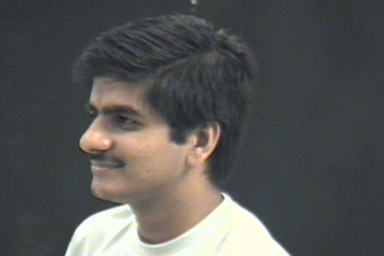

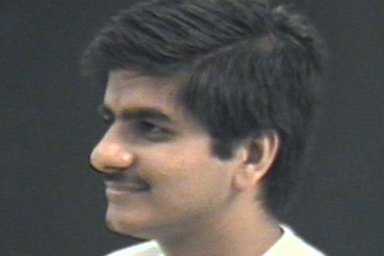

In [424]:
v_im = Image.open('iris_ready_v3/source_dir/Vivek-1147.bmp')
display(v_im)
cropped_img = v_im.crop((12, 25, v_im.width-85, v_im.height-40)) #left, upper, right, lower
# (32, 25, v_im.width-45, v_im.height-40)
resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
#display(cropped_img)
display(resized)

In [425]:
def process_iris(mypath, outpath):
    dirs = os.listdir(mypath)
    counter = 1
    for item in dirs:
        fullpath = os.path.join(mypath, item)
        if os.path.isfile(fullpath):
            counter += 1
            im = Image.open(fullpath)
            f, e = os.path.splitext(fullpath) #file and extension
            cropped_img = im.crop((12, 25, v_im.width-85, v_im.height-40)) #left, upper, right, lower
            resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
            #resized = im.resize((neww, newh), Image.ANTIALIAS) #resize
            save_fname = os.path.join(outpath, os.path.basename(f) +'.bmp')
            resized.save(save_fname, quality=100)
            #if counter <=10:
                #display(resized) #see in notebook
    print("done")

    
process_iris(test_path, outpath)

done


<h3>Test Set</h3>

<b>Meng is ok</b>

<b>Vicky</b>

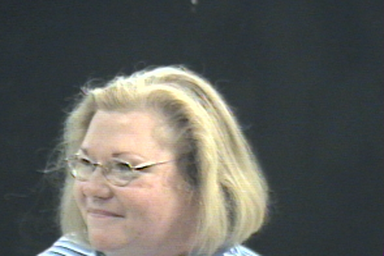

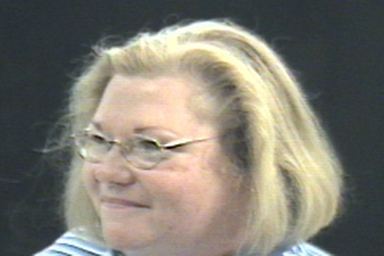

In [430]:
v_im = Image.open('iris_ready_v3/source_dir/Vicky-1280.bmp')
display(v_im)
cropped_img = v_im.crop((12, 50, v_im.width-85, v_im.height)) #left, upper, right, lower
resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
#display(cropped_img)
display(resized)

In [431]:
test_path = "iris_ready_v3/source_dir" # source
outpath =  "iris_ready_v3/target_dir/A/test" # target
#dirs = os.listdir(path)
neww, newh = 384, 256

def process_iris(mypath, outpath):
    dirs = os.listdir(mypath)
    counter = 1
    for item in dirs:
        fullpath = os.path.join(mypath, item)
        if os.path.isfile(fullpath):
            counter += 1
            im = Image.open(fullpath)
            f, e = os.path.splitext(fullpath) #file and extension
            cropped_img = im.crop((12, 50, v_im.width-85, v_im.height)) #left, upper, right, lower
            resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
            #resized = im.resize((neww, newh), Image.ANTIALIAS) #resize
            save_fname = os.path.join(outpath, os.path.basename(f) +'.bmp')
            resized.save(save_fname, quality=100)
            #if counter <=10:
                #display(resized) #see in notebook
    print("done")

In [432]:
process_iris(test_path, outpath)

done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done


<b>Vijay</b>

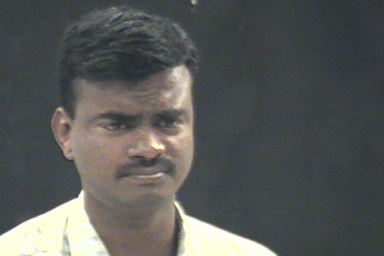

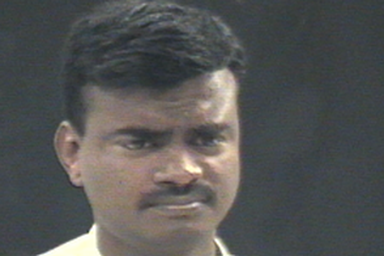

In [473]:
v_im = Image.open('iris_ready_v3/source_dir/Vijay-1294.bmp')
display(v_im)
cropped_img = v_im.crop((10, 10, v_im.width-80, v_im.height-40)) #left, upper, right, lower
resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
#display(cropped_img)
display(resized)

In [474]:
test_path = "iris_ready_v3/source_dir" # source
outpath =  "iris_ready_v3/target_dir/A/test" # target
#dirs = os.listdir(path)
neww, newh = 384, 256


def process_iris(mypath, outpath):
    dirs = os.listdir(mypath)
    counter = 1
    for item in dirs:
        fullpath = os.path.join(mypath, item)
        if os.path.isfile(fullpath):
            counter += 1
            im = Image.open(fullpath)
            f, e = os.path.splitext(fullpath) #file and extension
            cropped_img = im.crop((10, 10, v_im.width-80, v_im.height-40)) #left, upper, right, lower
            resized = cropped_img.resize((v_im.width, v_im.height), Image.ANTIALIAS) #resize
            #resized = im.resize((neww, newh), Image.ANTIALIAS) #resize
            save_fname = os.path.join(outpath, os.path.basename(f) +'.bmp')
            resized.save(save_fname, quality=100)
            #if counter <=10:
                #display(resized) #see in notebook
    print("done")
    
process_iris(test_path, outpath)

done


In the original data, some thermal and visible images, were captured, but without a pair: 

<b>Now combine them using the official pix2pix repo</b>

In [482]:
! python '/Users/xxx/Documents/GANs_Research/official_imps/pytorch-CycleGAN-and-pix2pix/datasets/combine_A_and_B.py' --fold_A 'iris_ready_v3/target_dir/A' --fold_B 'iris_ready_v3/target_dir/B' --fold_AB 'iris_v3_pairs'

[fold_A] =  iris_ready_v3/target_dir/A
[fold_B] =  iris_ready_v3/target_dir/B
[fold_AB] =  iris_v3_pairs
[num_imgs] =  1000000
[use_AB] =  False
[no_multiprocessing] =  False
split = test, use 99/99 images
split = test, number of images = 99
split = train, use 847/847 images
split = train, number of images = 847
